In [10]:
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.colors import Normalize, LogNorm
from matplotlib.animation import FuncAnimation
from matplotlib import rc, rcParams
from plotly.graph_objs import Line
from plotly.graph_objs.scatter.marker import Line
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import plotly
import pandas as pd
import numpy as np


rc('animation', html='jshtml')
rcParams['animation.embed_limit'] = 2**32
plt.style.use('seaborn')

%matplotlib inline
plt.rcParams['figure.figsize'] = [16, 12]

In [2]:
from app.MyFuncAnimator import MyFuncAnimator
from app.data_handler import DataHandler

In [3]:
dh = DataHandler()
covid_df = dh.get_recorded_covid_cases("data/RKI_COVID19.csv")
vac_df = pd.read_csv("data/RKI_COVID19_Impfungen.csv", sep=",")
rs_df = dh.get_district_geometries()
covid_df

,Bundesland,Landkreis,Altersgruppe,Meldedatum,AnzahlFall,AnzahlTodesfall,NeuGenesen,RS
0,Schleswig-Holstein,SK Flensburg,A15-A34,2021/02/17 00:00:00,3,0,0,01001
1,Schleswig-Holstein,SK Flensburg,A15-A34,2021/02/17 00:00:00,1,0,0,01001
2,Schleswig-Holstein,SK Flensburg,A15-A34,2021/02/18 00:00:00,1,0,0,01001
3,Schleswig-Holstein,SK Flensburg,A15-A34,2021/02/18 00:00:00,1,0,0,01001
4,Schleswig-Holstein,SK Flensburg,A15-A34,2021/02/18 00:00:00,1,0,0,01001
...,...,...,...,...,...,...,...,...
3387383,Thüringen,LK Altenburger Land,A80+,2020/12/25 00:00:00,1,1,-9,16077
3387384,Thüringen,LK Altenburger Land,A80+,2020/12/25 00:00:00,4,0,0,16077
3387385,Thüringen,LK Altenburger Land,A80+,2020/12/25 00:00:00,2,2,-9,16077
3387386,Thüringen,LK Altenburger Land,A80+,2020/12/27 00:00:00,3,0,0,16077


In [4]:
date_lst_germany = sorted(covid_df["Meldedatum"].drop_duplicates().tolist())
date_lst_germany = date_lst_germany[0:50]
#date_lst_germany

['2020/01/02 00:00:00',
 '2020/01/23 00:00:00',
 '2020/01/28 00:00:00',
 '2020/01/29 00:00:00',
 '2020/01/31 00:00:00',
 '2020/02/01 00:00:00',
 '2020/02/03 00:00:00',
 '2020/02/04 00:00:00',
 '2020/02/05 00:00:00',
 '2020/02/06 00:00:00',
 '2020/02/07 00:00:00',
 '2020/02/11 00:00:00',
 '2020/02/17 00:00:00',
 '2020/02/18 00:00:00',
 '2020/02/20 00:00:00',
 '2020/02/24 00:00:00',
 '2020/02/25 00:00:00',
 '2020/02/26 00:00:00',
 '2020/02/27 00:00:00',
 '2020/02/28 00:00:00',
 '2020/02/29 00:00:00',
 '2020/03/01 00:00:00',
 '2020/03/02 00:00:00',
 '2020/03/03 00:00:00',
 '2020/03/04 00:00:00',
 '2020/03/05 00:00:00',
 '2020/03/06 00:00:00',
 '2020/03/07 00:00:00',
 '2020/03/08 00:00:00',
 '2020/03/09 00:00:00',
 '2020/03/10 00:00:00',
 '2020/03/11 00:00:00',
 '2020/03/12 00:00:00',
 '2020/03/13 00:00:00',
 '2020/03/14 00:00:00',
 '2020/03/15 00:00:00',
 '2020/03/16 00:00:00',
 '2020/03/17 00:00:00',
 '2020/03/18 00:00:00',
 '2020/03/19 00:00:00',
 '2020/03/20 00:00:00',
 '2020/03/21 00:

  0%|          | 0/51 [00:00<?, ?it/s]

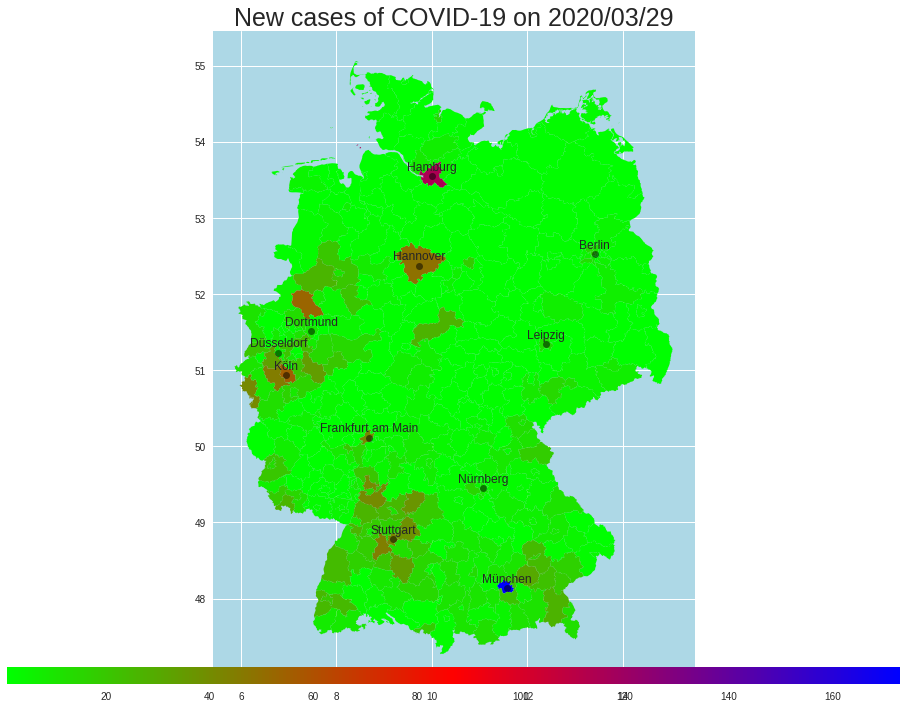

In [5]:
myfunc_germany = MyFuncAnimator(covid_df,rs_df,date_lst_germany,"AnzahlFall")
my_germany = myfunc_germany.FuncAnimator()
my_germany

In [6]:
vac_df

,Impfdatum,LandkreisId_Impfort,Altersgruppe,Impfschutz,Anzahl
0,2020-12-27,01003,18-59,1,9
1,2020-12-27,01003,60+,1,19
2,2020-12-27,01053,18-59,1,13
3,2020-12-27,01053,60+,1,200
4,2020-12-27,01055,18-59,1,20
...,...,...,...,...,...
284083,2021-07-20,u,12-17,2,16
284084,2021-07-20,u,18-59,1,271
284085,2021-07-20,u,18-59,2,884
284086,2021-07-20,u,60+,1,18


In [7]:
parameters = dh.real_seir(covid_df,vac_df)
parameters

{'AnzahlFall': Meldedatum
 2020-01-02        1
 2020-01-23        1
 2020-01-28        2
 2020-01-29        2
 2020-01-31        4
               ...  
 2021-12-26    10391
 2021-12-27    24114
 2021-12-28    42607
 2021-12-29    39578
 2021-12-30    29449
 Name: AnzahlFall, Length: 691, dtype: int64,
 'AnzahlTodesfall': Meldedatum
 2020-01-02     0
 2020-01-23     0
 2020-01-28     0
 2020-01-29     0
 2020-01-31     0
               ..
 2021-12-26    24
 2021-12-27    35
 2021-12-28    23
 2021-12-29    12
 2021-12-30     2
 Name: AnzahlTodesfall, Length: 691, dtype: int64,
 'NeuGenesen': Meldedatum
 2020-01-02        0
 2020-01-23        0
 2020-01-28        0
 2020-01-29        0
 2020-01-31        0
               ...  
 2021-12-26    36383
 2021-12-27    65340
 2021-12-28    97881
 2021-12-29    98299
 2021-12-30    61723
 Name: NeuGenesen, Length: 691, dtype: int64,
 'AnzahlImpfungen': Meldedatum
 2020-01-02    0.0
 2020-01-23    0.0
 2020-01-28    0.0
 2020-01-29    0.0
 2020-0

In [8]:
def real_seir_plot(parameters):

        """
        Plots the course of the parameter development over time.

        Returns a plotly express figure
        """

        fig = go.Figure()
        fig = make_subplots(specs=[[{"secondary_y": True}]])
        dates = list(parameters["AnzahlFall"].keys())
        for key, values in parameters.items():
            if key != "AnzahlAnfälligen":
                fig.add_trace(go.Line(x=dates, y=parameters[key], name=key))
            else:
                fig.add_trace(go.Line(x=dates, y=parameters[key], name=key), secondary_y=True, )

        fig.update_yaxes(range=[0, 83240000], secondary_y=True)
        return fig.show()

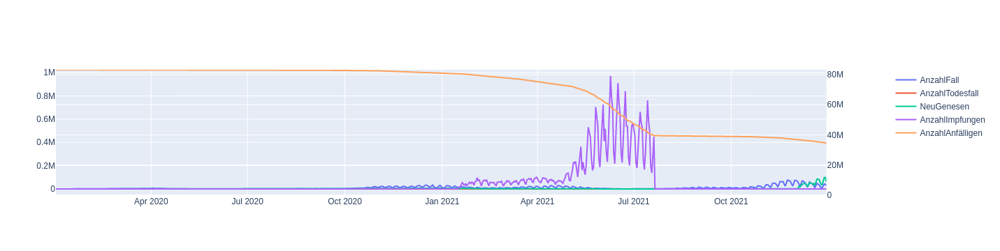

In [12]:
from plotly.graph_objs import Line
from plotly.graph_objs.scatter.marker import Line

real_seir_plot(parameters)